# COMET FLYBY ANIMATIONS

This notebook demonstrates how fundamental physical principles can be combined with numerical methods to model and visualize cometary motion in the solar system. Beginning with Newton’s law of gravitation, the equations of motion are formulated as a system of ordinary differential equations and integrated using scipy.integrate.solve_ivp. This framework allows students to engage directly with time-dependent orbital dynamics rather than relying solely on static representations. Animated trajectories are first used to build intuition for gravitational acceleration, energy conservation, and perihelion distance, providing a dynamic complement to lecture-based instruction. The analysis is then extended to three dimensions to highlight the role of orbital inclination and to convey the spatial scale of the solar system, making clear why two-dimensional projections can obscure important aspects of comet behavior. Overall, the notebook is structured to support undergraduate instruction and guided research by integrating physics, computation, and visualization in a manner that is both accessible and conceptually rigorous.

## 1. Introduction

In this notebook, we will graph the motion of a comet traveling through the inner solar system using matplotlib.  We are not going to just limit this to Jupiter Family Comets, but extend it to all types, so this will be a 3D plot taking in multiple parameters.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# for animation purposes
from matplotlib.animation import FuncAnimation

# to map out the path of the comet in 6D space
from scipy.integrate import solve_ivp

The functions used below will take in the following comet parameters: its distance from Sun (R0), velocity at a given distance from the Sun (v0), the angle on the x-y plane of the solar system (alpha), the angle above the x-y plane of the solar system (beta), and the angle relative to the inward radial, which would be the direction of the gravitational field lines of the sun (theta).  A 3D plot showing a comparison of the different types of comet orbits will be shown along with an animation of a long period comet swinging around the Sun.

## 2. Generating Trajectories and Animations (2D)

As mentioned in the introduction, we have the following parameters to input into our function.  These parameters will place the comet somewhere in the xyz field of the solar system, with a velocity v0 and angle relative to the radial of the pull of gravity

R0 - the radius of the entry sphere.  This is the distance where we start the animation
v_r - the radial velocity at R0
v_t - the tangential velocity at T0
alpha_deg - the angle in the x-y plane where the solar system lives
beta_deg - the angle above the x-y plane of the solar system
theta_deg - direction within the tangent plane (deg). 0 uses +e_phi, 90 uses +e_beta

A simple two body gravity model is used to generate comet trajectories from initial conditions. For each comet, we specify an initial distance from the Sun $R_o$, choose a starting direction on the sky using angles $\alpha$ and $\beta$, and then build an initial velocity vector by combining an inward radial component with a perpendicular tangential component. The balance between speed and direction controls the comet’s specific orbital energy and angular momentum, which in turn sets whether the orbit is short period and nearly in the ecliptic like many Jupiter family comets, highly inclined or retrograde like Halley type comets, or near parabolic and arriving from random directions like long period Oort cloud comets. Because the integrator only needs the position and velocity vectors, the same code path applies to any comet type. Changing the initial radius, the velocity magnitude, and the velocity direction is enough to reproduce bound elliptical orbits, near escape trajectories, and hyperbolic interstellar like flybys, all within one consistent framework.

In [2]:

def initial_conditions(R0, v_r, v_t, alpha_deg, beta_deg, psi_deg):

    alpha = np.deg2rad(alpha_deg)
    beta  = np.deg2rad(beta_deg)
    psi   = np.deg2rad(psi_deg)

    # position on sphere
    r0 = R0 * np.array([np.cos(beta)*np.cos(alpha), np.cos(beta)*np.sin(alpha), np.sin(beta)])

    r_hat = r0 / np.linalg.norm(r0)

    # Build a deterministic tangent basis at that point
    # e_beta points toward increasing beta (roughly "up/down" on the sphere)
    e_beta = np.array([-np.sin(beta)*np.cos(alpha), -np.sin(beta)*np.sin(alpha), np.cos(beta)])
    
    e_beta /= np.linalg.norm(e_beta)

    # e_alpha (azimuthal) points toward increasing alpha (roughly "east")
    e_alpha = np.array([-np.sin(alpha), np.cos(alpha), 0.0])
    
    e_alpha /= np.linalg.norm(e_alpha)

    # Tangential direction in the tangent plane
    t_hat = np.cos(psi)*e_alpha + np.sin(psi)*e_beta
    
    t_hat /= np.linalg.norm(t_hat)

    # Velocity vector: radial + tangential
    v0_vec = v_r * r_hat + v_t * t_hat

    return r0, v0_vec

r_o, V_o = initial_conditions(39.8, -1.25, 0.30, 70.0, 75.0, 0.0)

print("POSITION VECTOR = ", r_o)
print("VELOCITY VECTOR = ", V_o)

POSITION VECTOR =  [ 3.52314881  9.6797718  38.44384789]
VELOCITY VECTOR =  [-0.39255944 -0.20140689 -1.20740728]


With these vectors we can now map the trajectory of the comet.  We will only consider this as a 2 body problem, so we are ignoring all of the other planets.  First we define a function that can track the motion of the comet as it travels through space.  The function **comet_vector** will track the 6 coordinate velocity over time, mapping out the trajectory of the comet

In [3]:
def comet_vector(t, r):
    
    Gu = 4*np.pi**2       # AU^3 / r^2
    x, y, z, vx, vy, vz = r
    r_ = np.sqrt(x*x + y*y + z*z)
    ax = -Gu * x / r_**3
    ay = -Gu * y / r_**3
    az = -Gu * z / r_**3
    
    return [vx, vy, vz, ax, ay, az]

Now let us create our trajectory function to call **comet_vector** and map out the path of the comet with matplotlib.  Once this is done we can confirm what kind of trajectory it is before we create an animation for the comet.  It would be safe to assume we have generated an unbound comet with a hyperbolic orbit.

Perihelion distance ≈ 2.114 AU at t ≈ 21.02 yr


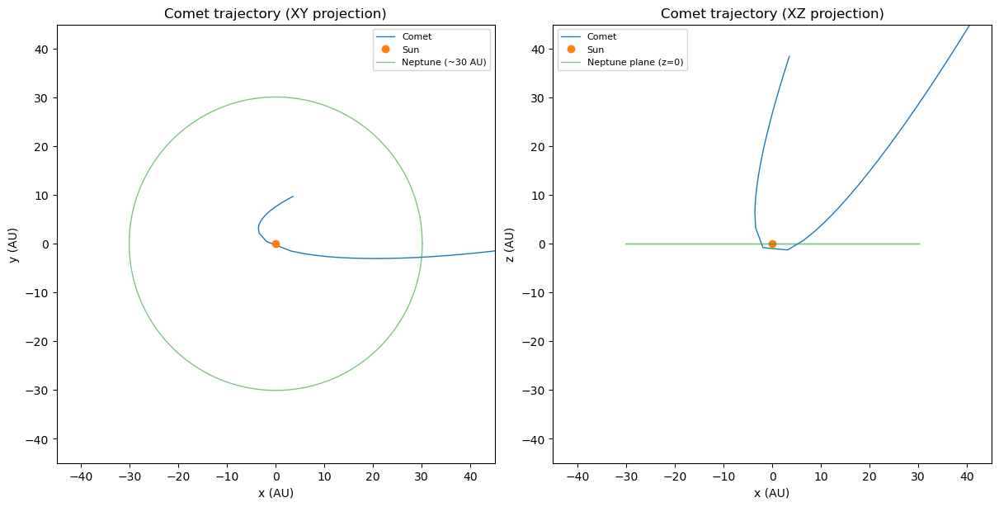

In [4]:
def comet_trajectory_plot(r0, v0, time, n=1000, lim=45):

    # Initial state vector
    R_V = np.hstack((r0, v0))

    t_span = (0.0, time)
    t_eval = np.linspace(t_span[0], t_span[1], n)

    # Integrate trajectory
    sol = solve_ivp(
        comet_vector,
        t_span,
        R_V,
        t_eval=t_eval,
        rtol=1e-8,
        atol=1e-10
    )

    if not sol.success:
        raise RuntimeError(sol.message)

    # Extract position components
    x = sol.y[0]
    y = sol.y[1]
    z = sol.y[2]
    r = np.sqrt(x*x + y*y + z*z)

    # Perihelion diagnostics
    idx = np.argmin(r)
    print(f"Perihelion distance ≈ {r[idx]:.3f} AU at t ≈ {sol.t[idx]:.2f} yr")

    # Neptune orbit (simple circular reference in the ecliptic)
    neptune_a = 30.1  # AU
    th = np.linspace(0, 2*np.pi, 600)
    nx = neptune_a * np.cos(th)
    ny = neptune_a * np.sin(th)
    nz = np.zeros_like(th)

    # ---- Plot: two panels ----
    fig, (ax_xy, ax_xz) = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)

    # XY projection
    ax_xy.plot(x, y, lw=1, label="Comet")
    ax_xy.plot(0, 0, 'o', label="Sun")
    
    # Neptune's orbit
    ax_xy.plot(nx, ny, lw=1, alpha=0.6, label="Neptune (~30 AU)")

    ax_xy.set_aspect('equal', 'box')
    ax_xy.set_xlim(-lim, lim)
    ax_xy.set_ylim(-lim, lim)
    ax_xy.set_xlabel("x (AU)")
    ax_xy.set_ylabel("y (AU)")
    ax_xy.set_title("Comet trajectory (XY projection)")
    ax_xy.legend(fontsize=8)

    # XZ projection
    ax_xz.plot(x, z, lw=1, label="Comet")
    ax_xz.plot(0, 0, 'o', label="Sun")

    # Neptune on the XZ
    ax_xz.plot(nx, nz, lw=1, alpha=0.6, label="Neptune plane (z=0)")

    ax_xz.set_aspect('equal', 'box')
    ax_xz.set_xlim(-lim, lim)
    ax_xz.set_ylim(-lim, lim)
    ax_xz.set_xlabel("x (AU)")
    ax_xz.set_ylabel("z (AU)")
    ax_xz.set_title("Comet trajectory (XZ projection)")
    ax_xz.legend(fontsize=8)

    plt.show()
    
comet_trajectory_plot(r_o, V_o, time = 1000)

From the parameters we elected, we can calculate the specific energy pfor the comet's orbit, to confirm that we created a comet with a hyperbolic orbit.  The specific energy, $\epsilon$, is equal to the total mechanical energy $E$ of the comet in the Sun's gravitational potential field divided by the mass of the comet.  $K$ is the kinetic energy of the comet, $U$ is the potential energy of the comet in the Sun's ($M_{\odot}$) gravitational field

\begin{equation}
K = \frac{1}{2}m_{comet}v^{2}          \\
\\
U = -\frac{GM_{\odot}m_{comet}}{r}      \\
\\
E = K + U = \frac{1}{2}m_{comet}v^{2}-\frac{GM_{\odot}m_{comet}}{r}        \\
\\
\epsilon =\frac{E}{m_{comet}}= \frac{v^2}{2} - \frac{GM_{\odot}}{r}    \\
\end{equation}

Because we are using astronomical units for R and V0 (AU/yr) we will simply substitute $4\pi^{2}$ for $GM_{\odot}$

\begin{equation}
\epsilon = \frac{v^2}{2} - \frac{4\pi^{2}}{r}  
\end{equation}

if $\epsilon > 0$ we have an hyperbolic orbit (unbound), $\epsilon < 0$ we have an elliptical orbit (bound), and $\epsilon = 0$ gives us a parabolic orbit (still unbound, right at the threshold).  So to calculate this for our comet below.  We will look at the specific energy, inclination, and eccentricity.

In [5]:
def orbital_parameters(r0, v0):
    
    Gu = 4*np.pi**2 
    
    r0_mag = np.linalg.norm(r0)
    v0_mag = np.linalg.norm(v0)
    
    E = 0.5*v0_mag**2 - Gu/r0_mag
    print("Specific energy ε = ", E)
    
    # inclination calculation
    h_vec = np.cross(r0, v0)
    h = np.linalg.norm(h_vec)
    i = np.arccos(h_vec[2]/h)  # radians
    print("Inclination i = ", np.degrees(i), "deg")
    
    # eccentricity calculation
    e_vec = np.cross(v0, h_vec)/Gu - (r0 / r0_mag)
    e = np.linalg.norm(e_vec)
    print("Eccentricity e = ", e)
    
orbital_parameters(r_o, V_o)
    

Specific energy ε =  -0.16567004031048838
Inclination i =  75.0 deg
Eccentricity e =  0.9847291962712718


These parameters above suggest that our example comet is bound in a very very eccentric orbit, and is most likely a Halley type comet from the Oort cloud given the inclination.

Now we will produce an animation of the comet as it moves into the inner solar system.  We will show two panels with the comets motion in the XY plane and the XZ plane.

In [6]:

from IPython.display import HTML

def comet_plotter(r0, v0, t_span, n, lim, interval):

    r0 = np.asarray(r0, dtype=float)
    v0 = np.asarray(v0, dtype=float)

    if r0.shape != (3,) or v0.shape != (3,):
        raise ValueError("r0 and v0 must be length-3 vectors: [x,y,z] and [vx,vy,vz].")

    # Initial state: [x,y,z,vx,vy,vz]
    y0 = np.hstack((r0, v0))

    # Times to evaluate (also becomes animation frames)
    t_eval = np.linspace(t_span[0], t_span[1], n)

    # Integrate (comet_vector must exist in your notebook already)
    sol = solve_ivp(
        comet_vector,
        t_span,
        y0,
        t_eval=t_eval,
        rtol=1e-8,
        atol=1e-10
    )

    if not sol.success:
        raise RuntimeError(f"Integration failed: {sol.message}")

    # Extract arrays
    x = sol.y[0]
    y_ = sol.y[1]
    z = sol.y[2]
    r = np.sqrt(x*x + y_*y_ + z*z)

    # Neptune orbit reference (simple circle in ecliptic)
    neptune_a = 30.1  # AU
    th = np.linspace(0, 2*np.pi, 600)
    nx = neptune_a * np.cos(th)
    ny = neptune_a * np.sin(th)
    nz = np.zeros_like(th)

    # ---- Figure: two panels ----
    fig, (ax_xy, ax_xz) = plt.subplots(1, 2, figsize=(8, 4), constrained_layout=True)

    # XY panel
    ax_xy.set_aspect('equal', 'box')
    ax_xy.set_xlim(-lim, lim)
    ax_xy.set_ylim(-lim, lim)
    ax_xy.set_xlabel("x (AU)")
    ax_xy.set_ylabel("y (AU)")
    ax_xy.set_title("XY projection")

    # XZ panel
    ax_xz.set_aspect('equal', 'box')
    ax_xz.set_xlim(-lim, lim)
    ax_xz.set_ylim(-lim, lim)
    ax_xz.set_xlabel("x (AU)")
    ax_xz.set_ylabel("z (AU)")
    ax_xz.set_title("XZ projection")

    # Sun markers
    ax_xy.plot(0, 0, 'o', label="Sun")
    ax_xz.plot(0, 0, 'o', label="Sun")

    # Neptune 
    ax_xy.plot(nx, ny, lw=1, alpha=0.6, label="Neptune (~30 AU)")
    ax_xz.plot(nx, nz, lw=1, alpha=0.6, label="Neptune plane (z=0)")

    ax_xy.legend(fontsize=8, loc="upper right")
    ax_xz.legend(fontsize=8, loc="upper right")

    # Artists: trails + points
    trail_xy, = ax_xy.plot([], [], lw=1)
    pt_xy,    = ax_xy.plot([], [], 'o', markersize=4)

    trail_xz, = ax_xz.plot([], [], lw=1)
    pt_xz,    = ax_xz.plot([], [], 'o', markersize=4)

    # One shared text label (keep it on left panel)
    txt = ax_xy.text(0.02, 0.95, "", transform=ax_xy.transAxes)

    def init():
        trail_xy.set_data([], [])
        pt_xy.set_data([], [])

        trail_xz.set_data([], [])
        pt_xz.set_data([], [])

        txt.set_text("")
        return trail_xy, pt_xy, trail_xz, pt_xz, txt

    def update(k):
        # Trails
        trail_xy.set_data(x[:k], y_[:k])
        trail_xz.set_data(x[:k], z[:k])

        # Current points (wrap scalars in lists to avoid Matplotlib 3.7+ warnings)
        pt_xy.set_data([x[k]], [y_[k]])
        pt_xz.set_data([x[k]], [z[k]])

        txt.set_text(f"t={sol.t[k]:.2f} yr   r={r[k]:.2f} AU   z={z[k]:.2f} AU")
        return trail_xy, pt_xy, trail_xz, pt_xz, txt

    ani = FuncAnimation(
        fig,
        update,
        frames=len(sol.t),
        init_func=init,
        interval=interval,
        blit=False
    )

    plt.close(fig)
    return sol, ani


T_SPAN = (-50, 50)
SOL, ANIMATION = comet_plotter(r_o, V_o, T_SPAN, 350, 40, 20)
HTML(ANIMATION.to_jshtml())



These kinds of plots of comets demonstrate how numerical modeling, visualization, and physical reasoning can be integrated into undergraduate instruction in a way that is rigorous, scalable, and engaging.  By emphasizing exploration over rote calculation, it allows students to interact with real astrophysical phenomena while developing computational confidence. At the community college level, this approach helps bridge the gap between classroom physics and authentic scientific inquiry, preparing students for both transfer and research-oriented pathways.

Because the code is modular, students can extend it in meaningful, research-adjacent directions without being overwhelmed. Examples include:

- Short vs long period comets - Students classify trajectories by energy and eccentricity and relate them to physical origins such as the Kuiper Belt or Oort Cloud.

 - Interstellar objects - By adjusting hyperbolic excess velocity, students can model objects similar to 1I/ʻOumuamua, 2I/Borisov, or 3I/ATLAS and compare simulated paths to observational constraints.

 - Planetary perturbations - More advanced students can introduce Jupiter as a secondary mass and explore scattering and capture, linking classroom mechanics to current research topics.

## 3. A 3D Plot of Types of Comets 

In this section we use a simple Sun–comet two body model to compute comet trajectories from initial position and velocity vectors in a 3D space. Even with a basic Newtonian gravity model, we can reproduce the key qualitative differences between major comet classes.

We will compare the three comet categories by plotting them, as their orbits can separate them from each other:

- Jupiter Family Comets tend to have short orbital periods and low to moderate inclinations.

- Halley Type Comets have longer periods and often higher inclinations, including retrograde orbits.

- Long Period Comets can arrive from nearly any direction with inclinations that look almost random in 3D.

A major teaching point is that 2D projections can hide the true path. A 3D plot shows how inclination changes the geometry of the orbit and why “it looks like it bends late” can be a projection illusion, which can be created on the animations by using a lower inclination of 30 degrees (you might still be able to see the "illusion" with $i=90\deg$)

Jupiter Family (i≈4.9°): perihelion ≈ 6.688 AU at t ≈ 0.75 yr
Halley Type (i≈76.0°): perihelion ≈ 3.247 AU at t ≈ 828.96 yr
Long Period (i≈134.4°): perihelion ≈ 3.402 AU at t ≈ 1834.96 yr


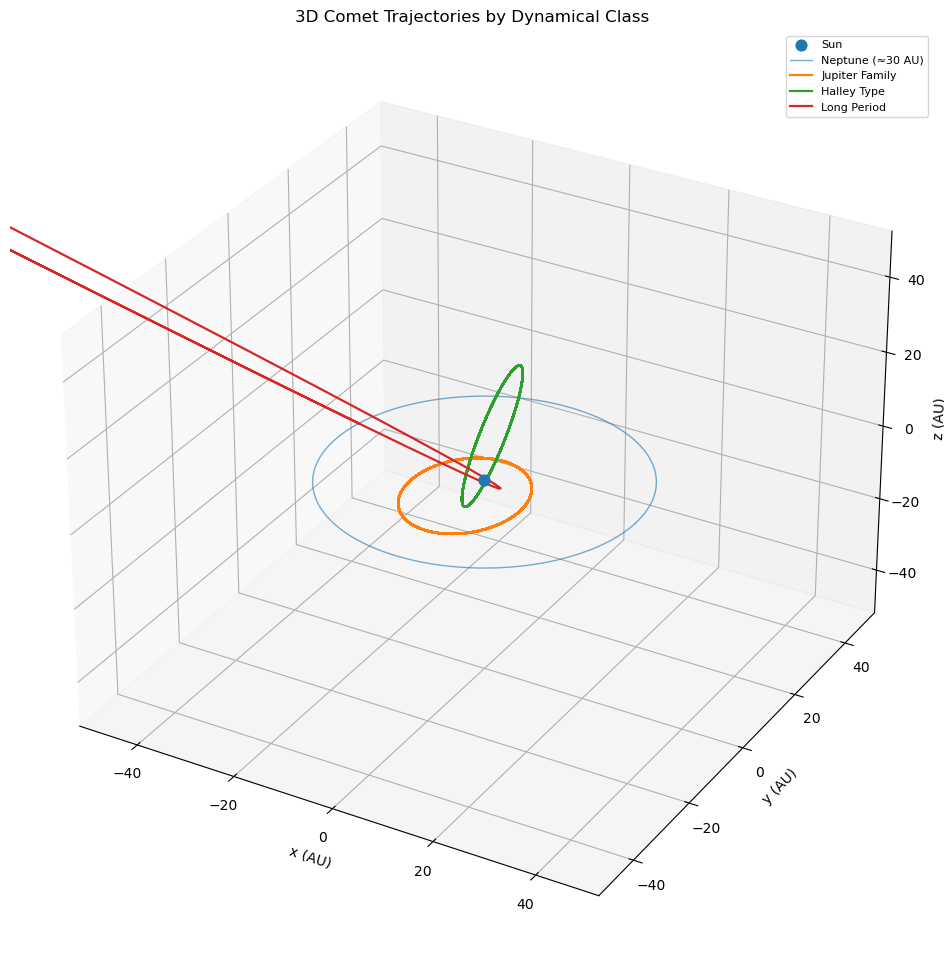

In [7]:
    
def comet_trajectory_plot_3D(COMETS, time, n, lim):
    
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111, projection="3d")

    # Sun
    ax.scatter([0], [0], [0], s=60, label="Sun")

    # NEPTUNE'S ORBIT (my fav planet btw)
    t_neptune = np.linspace(0, 2*np.pi, 600)    # time
    R = 30.1 # Neptune distance in AU
    
    nx, ny, nz = R*np.cos(t_neptune), R*np.sin(t_neptune), np.zeros_like(t_neptune)     
    ax.plot(nx, ny, nz, lw=1, alpha=0.6, label="Neptune (≈30 AU)")


    # plot the comets over the same time span
    t_span = (0.0, time)
    t_eval = np.linspace(t_span[0], t_span[1], n)

    sols = []

    for entry in COMETS:
        
        # in case the list is incorrect
        if len(entry) != 4:
            raise ValueError("Each COMETS entry must be [r0, v0, inc_deg, label].")

        r0, v0, inc_deg, label = entry

        r0 = np.asarray(r0, dtype=float)
        v0 = np.asarray(v0, dtype=float)

        if r0.shape != (3,) or v0.shape != (3,):
            raise ValueError(f"{label}: r0 and v0 must be length-3 vectors.")

        y0 = np.hstack((r0, v0))

        sol = solve_ivp(
            comet_vector,
            t_span,
            y0,
            t_eval=t_eval,
            rtol=1e-8,
            atol=1e-10
        )

        if not sol.success:
            raise RuntimeError(f"{label}: integration failed: {sol.message}")

        x, y, z = sol.y[0], sol.y[1], sol.y[2]
        r = np.sqrt(x*x + y*y + z*z)

        idx = np.argmin(r)
        print(
            f"{label} (i≈{inc_deg:.1f}°): "
            f"perihelion ≈ {r[idx]:.3f} AU at t ≈ {sol.t[idx]:.2f} yr"
        )

        ax.plot(x, y, z, lw=1.6, label=label)
        sols.append(sol)

    # ----- axes styling -----
    ax.set_xlim(-lim, lim)
    ax.set_ylim(-lim, lim)
    ax.set_zlim(-lim, lim)
    ax.set_xlabel("x (AU)")
    ax.set_ylabel("y (AU)")
    ax.set_zlabel("z (AU)")
    ax.set_title("3D Comet Trajectories by Dynamical Class")

    ax.legend(fontsize=8)
    plt.show()

    return sols

# inclinations
I_JF = 4.9   
I_HT = 76.0
I_LP = 134.4

# initial_conditions(distance, radial velocity, tagential velocity, 
#                    azimuthal angle, inclination angle, angle relative to radial of sun)

R_JF, V_JF = initial_conditions(6.8, -0.3, 2.9, 67.0, I_JF, 0)
R_HT, V_HT = initial_conditions(28.2, -1.0, 0.55, 11.0, I_HT, 0.0)
R_LP, V_LP = initial_conditions(39.8, 1.25, 0.4, 70.0, I_LP, 0.0)

COMETS = [
    [R_JF, V_JF, I_JF,  "Jupiter Family"],
    [R_HT, V_HT, I_HT, "Halley Type"],
    [R_LP, V_LP, I_LP,  "Long Period"]
]

SOLS = comet_trajectory_plot_3D(COMETS, 3000, 4000, 50)


Plotting all comet classes together emphasizes that the distinction between comet families is primarily dynamical rather than compositional. Jupiter-family comets tend to remain close to the ecliptic plane, while Halley-type and long-period comets exhibit large inclinations and, in some cases, retrograde motion.

This visualization also reinforces the importance of three-dimensional thinking in orbital mechanics. What may appear to be a delayed deflection or sudden curvature in a two-dimensional projection is often the result of motion occurring out of the plane of view.